In [62]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import itertools
from sklearn.metrics import f1_score, recall_score, precision_score,accuracy_score,confusion_matrix


x_train_text = pd.read_csv('../data/model_file/text_train_june.csv')
x_test_text = pd.read_csv('../data/model_file/text_test_june.csv')

y_train_text = x_train_text['label']
y_test_text = x_test_text['label']

x_train_audio = pd.read_csv('../data/model_file/audio_train_june.csv')
x_test_audio = pd.read_csv('../data/model_file/audio_test_june.csv')

y_train_audio = x_train_audio['label']
y_test_audio = x_test_audio['label']

y_train = y_train_audio # since y_train_audio == y_train_text
y_test = y_test_audio # since y_train_audio == y_train_text

print(x_train_text.shape, y_train_text.shape, x_train_audio.shape, y_train_audio.shape)
print(x_test_text.shape, y_test_text.shape, x_test_audio.shape, y_test_audio.shape)# combine the features upon on wav file name then spli to trainand text

(6400, 3) (6400,) (6400, 38) (6400,)
(1601, 3) (1601,) (1601, 38) (1601,)


In [63]:
# emotion_dict = {'ang': 0,
#                 'hap': 1,
#                 'sad': 2,
#                 'fea': 3,
#                 'sur': 4,
#                 'neu': 5}
emotion_dict = {'ang': 0, 
                'hap': 1, 
                'exc': 2,
                'sad': 3,
                'fru': 4,
                'fea': 5,
                'sur': 6,
                'neu': 7,
                'oth': 8}

emo_keys = list(emotion_dict.keys())

id_to_emotion = {emotion_dict[key]: key for key in emo_keys}

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    # plt.figure(figsize=(8,8))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    
def one_hot_encoder(true_labels, num_records, num_classes):
    temp = np.array(true_labels[:num_records])
    true_labels = np.zeros((num_records, num_classes))
    true_labels[np.arange(num_records), temp] = 1
    return true_labels

def display_results(y_test, pred_probs, cm=True):
    pred = np.argmax(pred_probs, axis=-1)
    one_hot_true = one_hot_encoder(y_test, len(pred), len(emotion_dict))
    print('Test Set Accuracy =  {0:.3f}'.format(accuracy_score(y_test, pred)))
    print('Test Set F-score =  {0:.3f}'.format(f1_score(y_test, pred, average='macro')))
    print('Test Set Precision =  {0:.3f}'.format(precision_score(y_test, pred, average='macro')))
    print('Test Set Recall =  {0:.3f}'.format(recall_score(y_test, pred, average='macro')))
    if cm:
        plot_confusion_matrix(confusion_matrix(y_test, pred), classes=emo_keys)

In [64]:
from sklearn.utils.class_weight import compute_sample_weight
sample_weights = compute_sample_weight(class_weight="balanced", y=x_train_text['label'])
sample_weights

array([0.80442433, 0.79720977, 0.80442433, ..., 0.79720977, 0.82399897,
       0.82687339])

In [102]:
# cl_weight = dict(pd.Series(x_train_text['label']).value_counts(normalize=True))
# sample_weights = pd.Series(x_train_text['label']).map(cl_weight)
# sample_weights

0       0.138125
1       0.139375
2       0.138125
3       0.136406
4       0.139375
          ...   
6395    0.138125
6396    0.138125
6397    0.139375
6398    0.134844
6399    0.134375
Name: label, Length: 6400, dtype: float64

## Get Text Features

In [65]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
import pickle

tfidf = TfidfVectorizer(sublinear_tf=True, min_df=1, norm='l2', encoding='latin-1', ngram_range=(1, 2), stop_words='english', max_features=100)
all_text = pd.concat([x_train_text, x_test_text])  

features_text = tfidf.fit_transform(all_text.transcription).toarray()
feature_names = tfidf.get_feature_names_out()

tfidf_vectorizer_filename = './tfidf_vectorizer.pkl'
with open(tfidf_vectorizer_filename, 'wb') as file:
    pickle.dump(tfidf, file)
print(f"TfidfVectorizer saved to {tfidf_vectorizer_filename}")

x_train_text = pd.DataFrame(features_text[:x_train_text.shape[0]], columns=feature_names)
x_test_text = pd.DataFrame(features_text[-x_test_text.shape[0]:], columns=feature_names)

print("Features matrix:", features_text.shape)
print("Train features DataFrame:", x_train_text.shape)
print("Test features DataFrame:", x_test_text.shape)



TfidfVectorizer saved to ./tfidf_vectorizer.pkl
Features matrix: (8001, 100)
Train features DataFrame: (6400, 100)
Test features DataFrame: (1601, 100)


In [66]:
tfidf.fit_transform(['excuse me excuse meexcuse meexcuse me']).toarray()

array([[0.57292883, 0.338381  , 0.338381  , 0.57292883, 0.338381  ]])

In [107]:
#examples
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
import pickle

# Assuming x_train_text and x_test_text are your input data.
tfidf = TfidfVectorizer(sublinear_tf=True, min_df=5, norm='l2', encoding='latin-1', ngram_range=(1, 2), stop_words='english', max_features=100)
all_text = pd.concat([x_train_text, x_test_text])  # Concatenate training and testing text data

# Fit the vectorizer and transform the text data to TF-IDF features
features_text = tfidf.fit_transform(all_text.transcription).toarray()

# Get feature names (column names) from the vectorizer
feature_names = tfidf.get_feature_names_out()

# Split the features back into training and testing sets and convert them to DataFrames with feature names
x_train_text_df = pd.DataFrame(features_text[:x_train_text.shape[0]], columns=feature_names)
x_test_text_df = pd.DataFrame(features_text[-x_test_text.shape[0]:], columns=feature_names)

# Save the fitted TfidfVectorizer
tfidf_vectorizer_filename = 'tfidf_vectorizer.pkl'
with open(tfidf_vectorizer_filename, 'wb') as file:
    pickle.dump(tfidf, file)
print(f"TfidfVectorizer saved to {tfidf_vectorizer_filename}")

# Save the transformed training features to a CSV file
x_train_text_filename = 'x_train_text_tfidf.csv'
x_train_text_df.to_csv(x_train_text_filename, index=False)
print(f"Transformed training features saved to {x_train_text_filename}")

# Save the transformed testing features to a CSV file
x_test_text_filename = 'x_test_text_tfidf.csv'
x_test_text_df.to_csv(x_test_text_filename, index=False)
print(f"Transformed testing features saved to {x_test_text_filename}")

# Save the labels if needed
y_train_filename = 'y_train.csv'
y_train.to_csv(y_train_filename, index=False)
print(f"Training labels saved to {y_train_filename}")

y_test_filename = 'y_test.csv'
y_test.to_csv(y_test_filename, index=False)
print(f"Testing labels saved to {y_test_filename}")

print("Features matrix:", features_text.shape)
print("Train features DataFrame:", x_train_text_df.shape)
print("Test features DataFrame:", x_test_text_df.shape)

AttributeError: 'DataFrame' object has no attribute 'transcription'

## Combine Text + Audio Features

In [108]:
x_train_audio.count()

wav_file         6400
label            6400
sig_mean         6400
sig_std          6400
rmse_mean        6400
rmse_std         6400
silence          6400
harmonic         6400
auto_corr_max    6400
auto_corr_std    6400
mfcc_1_mean      6400
mfcc_2_mean      6400
mfcc_3_mean      6400
mfcc_4_mean      6400
mfcc_5_mean      6400
mfcc_6_mean      6400
mfcc_7_mean      6400
mfcc_8_mean      6400
mfcc_9_mean      6400
mfcc_10_mean     6400
mfcc_11_mean     6400
mfcc_12_mean     6400
mfcc_13_mean     6400
mfcc_1_std       6400
mfcc_2_std       6400
mfcc_3_std       6400
mfcc_4_std       6400
mfcc_5_std       6400
mfcc_6_std       6400
mfcc_7_std       6400
mfcc_8_std       6400
mfcc_9_std       6400
mfcc_10_std      6400
mfcc_11_std      6400
mfcc_12_std      6400
mfcc_13_std      6400
mel_mean         6400
mel_std          6400
dtype: int64

In [109]:
x_train_text.count()

annie       6400
ask         6400
away        6400
believe     6400
business    6400
            ... 
wrong       6400
yeah        6400
year        6400
years       6400
yes         6400
Length: 100, dtype: int64

In [110]:
x_train_audio_selected = x_train_audio[x_train_audio.columns.difference(['wav_file', 'label'])]
x_train_audio_array = np.array(x_train_audio_selected)
x_test_audio_selected = x_test_audio[x_test_audio.columns.difference(['wav_file', 'label'])]
x_test_audio_array = np.array(x_test_audio_selected)

combined_x_train = np.concatenate((x_train_audio_array, x_train_text), axis=1)
combined_x_test = np.concatenate((x_test_audio_array, x_test_text), axis=1)

print(combined_x_train.shape, combined_x_test.shape)

combined_features_dict = {}

combined_features_dict['x_train'] = combined_x_train
combined_features_dict['x_test'] = combined_x_test
combined_features_dict['y_train'] = np.array(y_train)
combined_features_dict['y_test'] = np.array(y_test)

# with open('../data/model_file/combined_features.pkl', 'wb') as f:
#     pickle.dump(combined_features_dict, f)

(6400, 136) (1601, 136)


In [111]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import make_scorer, precision_score
import pandas as pd


# Define a custom scorer for precision with 'macro' averaging
precision_macro = make_scorer(precision_score, average='macro',zero_division=1)

# Define the parameter grid
param_grid = {
    'max_depth': [7,10],
    'learning_rate': [0.05],
    'n_estimators': [200,300],
    'booster': ['gbtree'],
    'colsample_bytree': [0.7],
    'subsample': [0.5, 0.8],
    'reg_alpha': [0, 0.01, 0.1],
    'reg_lambda': [1, 1.5, 2],
    'min_child_weight': [1, 5, 10]
}

# Initialize the XGBClassifier
xgb_classifier = xgb.XGBClassifier(
    objective='multi:softprob', 
    num_class=len(sample_weights), 
    n_jobs=10, 
    random_state=42
)

# Define the stratified k-fold cross-validator
skf = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(
    estimator=xgb_classifier, 
    param_grid=param_grid, 
    cv=skf, 
    scoring=precision_macro, 
    verbose=1
)

# Fit the grid search
grid_search.fit(combined_x_train, y_train, sample_weight=sample_weights)

# Best parameters
best_params = grid_search.best_params_
print("Best parameters found: ", best_params)

# Best model
best_model = grid_search.best_estimator_

# Early stopping with a validation set
eval_set = [(combined_x_train, y_train), (combined_x_test, y_test)]
best_model.fit(
    combined_x_train, y_train,
    eval_metric="mlogloss",
    eval_set=eval_set,
    # early_stopping_rounds=10,
    sample_weight=sample_weights
)

# Evaluate on the training set
train_predictions = best_model.predict(combined_x_train)
train_accuracy = accuracy_score(y_train, train_predictions)
train_classification_report = classification_report(y_train, train_predictions)
train_confusion_matrix = confusion_matrix(y_train, train_predictions)

print("Training set performance:")
print("Accuracy: ", train_accuracy)
print("Classification Report:\n", train_classification_report)
print("Confusion Matrix:\n", train_confusion_matrix)

# Evaluate on the test set
test_predictions = best_model.predict(combined_x_test)
test_accuracy = accuracy_score(y_test, test_predictions)
test_classification_report = classification_report(y_test, test_predictions)
test_confusion_matrix = confusion_matrix(y_test, test_predictions)

print("Test set performance:")
print("Accuracy: ", test_accuracy)
print("Classification Report:\n", test_classification_report)
print("Confusion Matrix:\n", test_confusion_matrix)


# Save the best model using pickle
model_filename = '../data/model/best_xgboost_model_without_early_stop.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(best_model, file)
print(f"Model saved to {model_filename}")

Fitting 3 folds for each of 216 candidates, totalling 648 fits
Best parameters found:  {'booster': 'gbtree', 'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 10, 'min_child_weight': 1, 'n_estimators': 300, 'reg_alpha': 0, 'reg_lambda': 1, 'subsample': 0.8}
[0]	validation_0-mlogloss:2.13657	validation_1-mlogloss:2.16157
[1]	validation_0-mlogloss:2.07703	validation_1-mlogloss:2.12602
[2]	validation_0-mlogloss:2.01931	validation_1-mlogloss:2.09291


/Users/sensenc/anaconda3/envs/sound_detection_project/lib/python3.10/site-packages/xgboost/sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-mlogloss:1.96791	validation_1-mlogloss:2.06172
[4]	validation_0-mlogloss:1.91503	validation_1-mlogloss:2.03289
[5]	validation_0-mlogloss:1.86567	validation_1-mlogloss:2.00446
[6]	validation_0-mlogloss:1.81823	validation_1-mlogloss:1.97719
[7]	validation_0-mlogloss:1.77301	validation_1-mlogloss:1.95120
[8]	validation_0-mlogloss:1.73187	validation_1-mlogloss:1.92852
[9]	validation_0-mlogloss:1.69098	validation_1-mlogloss:1.90624
[10]	validation_0-mlogloss:1.65041	validation_1-mlogloss:1.88463
[11]	validation_0-mlogloss:1.61392	validation_1-mlogloss:1.86417
[12]	validation_0-mlogloss:1.57459	validation_1-mlogloss:1.84243
[13]	validation_0-mlogloss:1.54004	validation_1-mlogloss:1.82238
[14]	validation_0-mlogloss:1.50485	validation_1-mlogloss:1.80402
[15]	validation_0-mlogloss:1.47457	validation_1-mlogloss:1.78674
[16]	validation_0-mlogloss:1.44451	validation_1-mlogloss:1.76946
[17]	validation_0-mlogloss:1.41415	validation_1-mlogloss:1.75275
[18]	validation_0-mlogloss:1.385

Fitting 3 folds for each of 216 candidates, totalling 648 fits
[0]	validation_0-mlogloss:2.16703	validation_1-mlogloss:2.17416
[1]	validation_0-mlogloss:2.13761	validation_1-mlogloss:2.15190
[2]	validation_0-mlogloss:2.10972	validation_1-mlogloss:2.12962
[3]	validation_0-mlogloss:2.08136	validation_1-mlogloss:2.10956
[4]	validation_0-mlogloss:2.05656	validation_1-mlogloss:2.09057
[5]	validation_0-mlogloss:2.03233	validation_1-mlogloss:2.07339
[6]	validation_0-mlogloss:2.00930	validation_1-mlogloss:2.05693
[7]	validation_0-mlogloss:1.98692	validation_1-mlogloss:2.04028
[8]	validation_0-mlogloss:1.96470	validation_1-mlogloss:2.02356
[9]	validation_0-mlogloss:1.94379	validation_1-mlogloss:2.00787
[10]	validation_0-mlogloss:1.92451	validation_1-mlogloss:1.99455
[11]	validation_0-mlogloss:1.90632	validation_1-mlogloss:1.98144
[12]	validation_0-mlogloss:1.89049	validation_1-mlogloss:1.96934
[13]	validation_0-mlogloss:1.87346	validation_1-mlogloss:1.95731
[14]	validation_0-mlogloss:1.85689	va

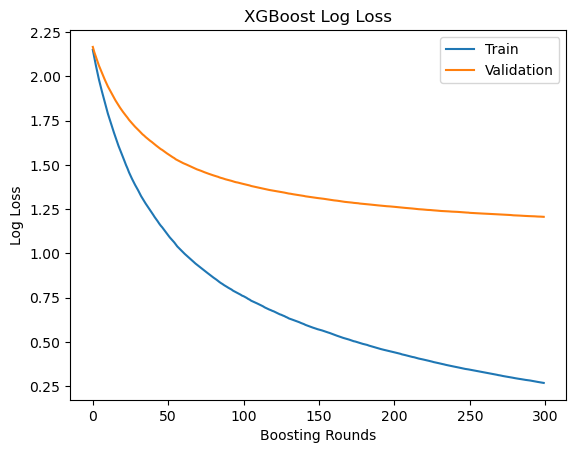

In [115]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV, train_test_split,StratifiedKFold
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix,make_scorer,precision_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

precision_macro = make_scorer(precision_score, average='macro',zero_division=1)


param_grid = {
    'max_depth': [5,7],
    'learning_rate': [0.05],
    'n_estimators': [250,300],
    'booster': ['gbtree'],
    'colsample_bytree': [0.7],
    'subsample': [0.5, 0.8],
    'reg_alpha': [0, 0.01, 0.1],
    'reg_lambda': [1, 1.5, 2],
    'min_child_weight': [1, 5, 10]
}

skf = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)


# Split the training data into training and validation sets
X_train_split, X_valid, y_train_split, y_valid, sample_weights_split, sample_weights_valid = train_test_split(
    combined_x_train, y_train, sample_weights, test_size=0.2, random_state=42
)

# Check if the sample weights match the training data
assert len(X_train_split) == len(y_train_split) == len(sample_weights_split), "Mismatch in training data and sample weights"

# Initialize XGBClassifier
xgb_classifier = xgb.XGBClassifier(
    objective='multi:softprob',
    num_class=len(np.unique(y_train)),
    n_jobs=10,
    random_state=42,
    early_stopping_rounds=20
)

# Initialize GridSearchCV with error_score='raise'
grid_search = GridSearchCV(
    estimator=xgb_classifier, 
    param_grid=param_grid, 
    cv=skf, 
    scoring=precision_macro, 
    verbose=1
)


# Fit the model with early stopping
try:
    grid_search.fit(
        X_train_split, y_train_split,
        sample_weight=sample_weights_split,
        eval_set=[(X_train_split, y_train_split), (X_valid, y_valid)],
        verbose=True
    )

    # Get the best parameters and best model
    best_params = grid_search.best_params_
    print("Best parameters found: ", best_params)

    best_model = grid_search.best_estimator_

    # Evaluate on the training set
    train_predictions = best_model.predict(combined_x_train)
    train_accuracy = accuracy_score(y_train, train_predictions)
    train_classification_report = classification_report(y_train, train_predictions)
    train_confusion_matrix = confusion_matrix(y_train, train_predictions)

    print("Training set performance:")
    print("Accuracy: ", train_accuracy)
    print("Classification Report:\n", train_classification_report)
    print("Confusion Matrix:\n", train_confusion_matrix)

    # Evaluate on the test set
    test_predictions = best_model.predict(combined_x_test)
    test_accuracy = accuracy_score(y_test, test_predictions)
    test_classification_report = classification_report(y_test, test_predictions)
    test_confusion_matrix = confusion_matrix(y_test, test_predictions)

    print("Test set performance:")
    print("Accuracy: ", test_accuracy)
    print("Classification Report:\n", test_classification_report)
    print("Confusion Matrix:\n", test_confusion_matrix)

    # Extract evaluation results
    results = best_model.evals_result()

    # Plot the results
    epochs = len(results['validation_0']['mlogloss'])
    x_axis = range(0, epochs)

    fig, ax = plt.subplots()
    ax.plot(x_axis, results['validation_0']['mlogloss'], label='Train')
    ax.plot(x_axis, results['validation_1']['mlogloss'], label='Validation')
    ax.legend()
    plt.xlabel('Boosting Rounds')
    plt.ylabel('Log Loss')
    plt.title('XGBoost Log Loss')
    plt.show()

except Exception as e:
    print(f"An error occurred: {e}")

In [116]:
test_predictions = best_model.predict(combined_x_test)
test_accuracy = accuracy_score(y_test, test_predictions)
test_classification_report = classification_report(y_test, test_predictions)
test_confusion_matrix = confusion_matrix(y_test, test_predictions)
print(test_classification_report)

              precision    recall  f1-score   support

           0       0.60      0.68      0.64       193
           1       0.69      0.66      0.68       241
           2       0.56      0.63      0.59       217
           3       0.66      0.80      0.72       209
           4       0.52      0.52      0.52       238
           5       0.89      0.62      0.73        13
           6       0.92      0.57      0.71        42
           7       0.49      0.47      0.48       220
           8       0.38      0.29      0.33       228

    accuracy                           0.57      1601
   macro avg       0.64      0.58      0.60      1601
weighted avg       0.57      0.57      0.57      1601


In [41]:
grid_search.best_estimator_

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7, device=None, early_stopping_rounds=10,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.11, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=10, num_class=9,
              num_parallel_tree=None, ...)

In [36]:
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt
# from sklearn.model_selection import train_test_split
# from sklearn.preprocessing import StandardScaler
# from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
# import torch
# import torch.nn as nn
# import torch.optim as optim
# from torch.utils.data import DataLoader, TensorDataset
# from sklearn.utils.class_weight import compute_sample_weight
# import torch.nn.functional as F
# 
# # Assuming combined_x_train, combined_x_test, y_train, y_test, and sample_weights are already defined
# 
# # Split the training data into training and validation sets
# X_train_split, X_valid, y_train_split, y_valid, sample_weights_split, sample_weights_valid = train_test_split(
#     combined_x_train, y_train, sample_weights, test_size=0.2, random_state=42
# )
# 
# # Standardize data
# scaler = StandardScaler()
# X_train_split = scaler.fit_transform(X_train_split)
# X_valid = scaler.transform(X_valid)
# combined_x_test = scaler.transform(combined_x_test)
# 
# # Convert data to PyTorch tensors
# X_train_split = torch.tensor(X_train_split, dtype=torch.float32)
# y_train_split = torch.tensor(y_train_split.values, dtype=torch.long)  # Convert Series to NumPy array
# X_valid = torch.tensor(X_valid, dtype=torch.float32)
# y_valid = torch.tensor(y_valid.values, dtype=torch.long)  # Convert Series to NumPy array
# combined_x_test = torch.tensor(combined_x_test, dtype=torch.float32)
# y_test = torch.tensor(y_test.values, dtype=torch.long)  # Convert Series to NumPy array
# 
# # Reshape the data to fit the CNN input
# X_train_split = X_train_split.view(-1, 1, X_train_split.shape[1], 1)  # Add channel and height dimension
# X_valid = X_valid.view(-1, 1, X_valid.shape[1], 1)  # Add channel and height dimension
# combined_x_test = combined_x_test.view(-1, 1, combined_x_test.shape[1], 1)  # Add channel and height dimension
# 
# # Create DataLoader
# train_dataset = TensorDataset(X_train_split, y_train_split)
# valid_dataset = TensorDataset(X_valid, y_valid)
# test_dataset = TensorDataset(combined_x_test, y_test)
# 
# train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
# valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False)
# test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
# 
# # Define the CNN model
# class CNN(nn.Module):
#     def __init__(self, num_classes):
#         super(CNN, self).__init__()
#         self.conv1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=(3, 1), padding=(1, 0))
#         self.pool = nn.MaxPool2d(kernel_size=(2, 1), stride=(2, 1))
#         self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=(3, 1), padding=(1, 0))
#         self.fc1 = nn.Linear(64 * (X_train_split.shape[2] // 4), 128)
#         self.dropout = nn.Dropout(0.5)
#         self.fc2 = nn.Linear(128, num_classes)
#     
#     def forward(self, x):
#         x = self.pool(F.relu(self.conv1(x)))
#         x = self.pool(F.relu(self.conv2(x)))
#         x = x.view(x.size(0), -1)
#         x = F.relu(self.fc1(x))
#         x = self.dropout(x)
#         x = self.fc2(x)
#         return x
# 
# # Initialize the model, loss function, and optimizer
# num_classes = len(np.unique(y_train))
# model = CNN(num_classes)
# criterion = nn.CrossEntropyLoss(weight=torch.tensor(compute_sample_weight('balanced', y_train_split.numpy()), dtype=torch.float32))
# optimizer = optim.Adam(model.parameters(), lr=0.001)
# 
# # Define early stopping parameters
# early_stopping_patience = 10
# early_stopping_counter = 0
# best_val_loss = float('inf')
# 
# # Train the model
# num_epochs = 200
# train_losses = []
# valid_losses = []
# 
# for epoch in range(num_epochs):
#     model.train()
#     running_loss = 0.0
#     for inputs, labels in train_loader:
#         optimizer.zero_grad()
#         outputs = model(inputs)
#         loss = criterion(outputs, labels)
#         loss.backward()
#         optimizer.step()
#         running_loss += loss.item()
#     
#     train_loss = running_loss / len(train_loader)
#     train_losses.append(train_loss)
#     
#     model.eval()
#     val_loss = 0.0
#     with torch.no_grad():
#         for inputs, labels in valid_loader:
#             outputs = model(inputs)
#             loss = criterion(outputs, labels)
#             val_loss += loss.item()
#     
#     val_loss /= len(valid_loader)
#     valid_losses.append(val_loss)
#     
#     print(f'Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}')
#     
#     # Early stopping
#     if val_loss < best_val_loss:
#         best_val_loss = val_loss
#         best_model_wts = model.state_dict().copy()
#         early_stopping_counter = 0
#     else:
#         early_stopping_counter += 1
#         if early_stopping_counter >= early_stopping_patience:
#             print("Early stopping")
#             break
# 
# # Load the best model weights
# model.load_state_dict(best_model_wts)
# 
# # Evaluate on the training set
# model.eval()
# train_predictions = []
# train_labels = []
# with torch.no_grad():
#     for inputs, labels in train_loader:
#         outputs = model(inputs)
#         _, preds = torch.max(outputs, 1)
#         train_predictions.extend(preds.numpy())
#         train_labels.extend(labels.numpy())
# 
# train_accuracy = accuracy_score(train_labels, train_predictions)
# train_classification_report = classification_report(train_labels, train_predictions)
# train_confusion_matrix = confusion_matrix(train_labels, train_predictions)
# 
# print("Training set performance:")
# print("Accuracy: ", train_accuracy)
# print("Classification Report:\n", train_classification_report)
# print("Confusion Matrix:\n", train_confusion_matrix)
# 
# # Evaluate on the test set
# test_predictions = []
# test_labels = []
# with torch.no_grad():
#     for inputs, labels in test_loader:
#         outputs = model(inputs)
#         _, preds = torch.max(outputs, 1)
#         test_predictions.extend(preds.numpy())
#         test_labels.extend(labels.numpy())
# 
# test_accuracy = accuracy_score(test_labels, test_predictions)
# test_classification_report = classification_report(test_labels, test_predictions)
# test_confusion_matrix = confusion_matrix(test_labels, test_predictions)
# 
# print("Test set performance:")
# print("Accuracy: ", test_accuracy)
# print("Classification Report:\n", test_classification_report)
# print("Confusion Matrix:\n", test_confusion_matrix)
# 
# # Plot the training and validation loss
# plt.figure(figsize=(10, 6))
# plt.plot(train_losses, label='Train Loss')
# plt.plot(valid_losses, label='Validation Loss')
# plt.xlabel('Epochs')
# plt.ylabel('Loss')
# plt.title('CNN Loss Over Epochs')
# plt.legend()
# plt.show()

In [37]:
y_valid

tensor([7, 7, 3,  ..., 1, 4, 3])

In [87]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Define the parameter grid for XGBoost
param_grid = {
    'max_depth': [3, 5, 7, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 200, 300],
    'booster': ['gbtree', 'gblinear'],
    'colsample_bytree': [0.3, 0.7],
    'subsample': [0.5, 0.8]
}

# Initialize the classifier
xgb_classifier = xgb.XGBClassifier(objective='multi:softprob', num_class=len(emotion_dict), n_jobs=10, random_state=42, max_depth=7, learning_rate=0.05, n_estimators=200, colsample_bytree=0.7, subsample=0.8)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=xgb_classifier, param_grid=param_grid, cv=3, scoring='accuracy', verbose=1)

# Fit the model
grid_search.fit(combined_x_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_
print("Best parameters found: ", best_params)

# Train the model with the best parameters
best_model = grid_search.best_estimator_

# Evaluate on the training set
train_predictions = best_model.predict(combined_x_train)
train_accuracy = accuracy_score(y_train, train_predictions)
train_classification_report = classification_report(y_train, train_predictions)
train_confusion_matrix = confusion_matrix(y_train, train_predictions)

print("Training set performance:")
print("Accuracy: ", train_accuracy)
print("Classification Report:\n", train_classification_report)
print("Confusion Matrix:\n", train_confusion_matrix)

# Evaluate on the test set
test_predictions = best_model.predict(combined_x_test)
test_accuracy = accuracy_score(y_test, test_predictions)
test_classification_report = classification_report(y_test, test_predictions)
test_confusion_matrix = confusion_matrix(y_test, test_predictions)

print("Test set performance:")
print("Accuracy: ", test_accuracy)
print("Classification Report:\n", test_classification_report)
print("Confusion Matrix:\n", test_confusion_matrix)


Fitting 3 folds for each of 288 candidates, totalling 864 fits


/Users/sensenc/anaconda3/envs/sound_detection_project/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning: [02:49:03] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "colsample_bytree", "max_depth", "subsample" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/sensenc/anaconda3/envs/sound_detection_project/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning: [02:49:04] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "colsample_bytree", "max_depth", "subsample" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/sensenc/anaconda3/envs/sound_detection_project/lib/python3.10/site-packages/xgboost/core.py:160: UserWarning: [02:49:05] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:742: 
Parameters: { "colsample_bytree", "max_depth", "subsample" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/sensenc/anaconda3/envs/sound_detection_project/lib/python3.10/site-packages/xgboo

Best parameters found:  {'booster': 'gbtree', 'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 10, 'n_estimators': 300, 'subsample': 0.5}
Training set performance:
Accuracy:  1.0
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       908
           1       1.00      1.00      1.00       860
           2       1.00      1.00      1.00       884
           3       1.00      1.00      1.00       892
           4       1.00      1.00      1.00       863
           5       1.00      1.00      1.00        67
           6       1.00      1.00      1.00       172
           7       1.00      1.00      1.00       881
           8       1.00      1.00      1.00       873

    accuracy                           1.00      6400
   macro avg       1.00      1.00      1.00      6400
weighted avg       1.00      1.00      1.00      6400

Confusion Matrix:
 [[908   0   0   0   0   0   0   0   0]
 [  0 860   0   0   0 

In [88]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

def evaluate_model(model, X_train, y_train, X_test, y_test):
    """
    Evaluates the performance of the XGBoost model on the training and test sets.
    
    Args:
    model (xgboost.XGBClassifier): The trained XGBoost model.
    X_train (numpy.ndarray): The training input data.
    y_train (numpy.ndarray): The training target variable.
    X_test (numpy.ndarray): The test input data.
    y_test (numpy.ndarray): The test target variable.
    
    Returns:
    dict: A dictionary containing the performance metrics for the training and test sets.
    """
    # Make predictions on the training and test sets
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Calculate performance metrics
    train_accuracy = accuracy_score(y_train, y_train_pred)
    train_f1 = f1_score(y_train, y_train_pred, average='macro')
    train_precision = precision_score(y_train, y_train_pred, average='macro')
    train_recall = recall_score(y_train, y_train_pred, average='macro')
    
    test_accuracy = accuracy_score(y_test, y_test_pred)
    test_f1 = f1_score(y_test, y_test_pred, average='macro')
    test_precision = precision_score(y_test, y_test_pred, average='macro')
    test_recall = recall_score(y_test, y_test_pred, average='macro')
    
    # Return the performance metrics
    return {
        'train_accuracy': train_accuracy,
        'train_f1': train_f1,
        'train_precision': train_precision,
        'train_recall': train_recall,
        'test_accuracy': test_accuracy,
        'test_f1': test_f1,
        'test_precision': test_precision,
        'test_recall': test_recall
    }

In [93]:
import xgboost as xgb



feature_importances = best_model.feature_importances_
sorted_indices = np.argsort(feature_importances)[::-1]
top_57_features = sorted_indices[:57]


combined_x_train_top_57 = combined_x_train[:, top_57_features]
combined_x_test_top_57 = combined_x_test[:, top_57_features]

best_model_ = xgb.XGBClassifier(objective='multi:softprob', num_class=len(emotion_dict), n_jobs=10, random_state=42, max_depth=7, learning_rate=0.05, n_estimators=200, colsample_bytree=0.7, subsample=0.8)
# xgb_classifier = xgb.XGBClassifier(objective='multi:softprob', num_class=len(emotion_dict), n_jobs=10, random_state=42, max_depth=7, learning_rate=0.05, n_estimators=200, colsample_bytree=0.7, subsample=0.8)

# Initialize GridSearchCV
# param_grid = {
#     'max_depth': [3, 5, 7, 10],
#     'learning_rate': [0.01, 0.05, 0.1],
#     'n_estimators': [100, 200, 300],
#     'booster': ['gbtree', 'gblinear'],
#     'colsample_bytree': [0.3, 0.7],
#     'subsample': [0.5, 0.8]
# }
# grid_search = GridSearchCV(estimator=best_model, param_grid=param_grid, cv=3, scoring='accuracy', verbose=1)

# Fit the model
# grid_search.fit(combined_x_train, y_train)

# Get the best parameters
best_params = best_model_.best_params_
best_model.fit(combined_x_train_top_57, y_train)

NotFittedError: need to call fit or load_model beforehand

In [90]:
train_predictions = best_model.predict(combined_x_train_top_57)
train_accuracy = accuracy_score(y_train, train_predictions)
train_classification_report = classification_report(y_train, train_predictions)
train_confusion_matrix = confusion_matrix(y_train, train_predictions)

print("Training set performance:")
print("Accuracy: ", train_accuracy)
print("Classification Report:\n", train_classification_report)
print("Confusion Matrix:\n", train_confusion_matrix)

# Evaluate on the test set
test_predictions = best_model.predict(combined_x_test_top_57)
test_accuracy = accuracy_score(y_test, test_predictions)
test_classification_report = classification_report(y_test, test_predictions)
test_confusion_matrix = confusion_matrix(y_test, test_predictions)

print("Test set performance:")
print("Accuracy: ", test_accuracy)
print("Classification Report:\n", test_classification_report)
print("Confusion Matrix:\n", test_confusion_matrix)


Training set performance:
Accuracy:  0.58796875
Classification Report:
               precision    recall  f1-score   support

           0       0.52      0.75      0.62       908
           1       0.82      0.49      0.62       860
           2       0.67      0.61      0.64       884
           3       0.53      0.85      0.65       892
           4       0.65      0.48      0.56       863
           5       0.88      0.54      0.67        67
           6       0.90      0.54      0.68       172
           7       0.50      0.53      0.52       881
           8       0.54      0.41      0.46       873

    accuracy                           0.59      6400
   macro avg       0.67      0.58      0.60      6400
weighted avg       0.62      0.59      0.58      6400

Confusion Matrix:
 [[681  13  36  28  37   1   2  61  49]
 [ 83 422  43 160  26   0   0  82  44]
 [143  15 537  29  43   0   0  65  52]
 [ 15   7   2 755  18   0   2  67  26]
 [140  19  66  96 418   0   1  70  53]
 [  9   1

In [61]:
performance_metrics = evaluate_model(best_model, combined_x_train_top_57, y_train, combined_x_test_top_57, y_test)
print(performance_metrics)

{'train_accuracy': 0.58796875, 'train_f1': 0.6001226769772502, 'train_precision': 0.6695241035148807, 'train_recall': 0.5769480482414612, 'test_accuracy': 0.39787632729544037, 'test_f1': 0.3686765133166378, 'test_precision': 0.4314576230460861, 'test_recall': 0.3677163401736452}


wouldn: 0.01662360318005085
um: 0.014896871522068977
sig_std: 0.01385783962905407
laughter: 0.013064436614513397
excited: 0.012893464416265488
things: 0.011699915863573551
just don: 0.011327333748340607
sig_mean: 0.010556924156844616
rmse_mean: 0.010266798548400402
sure: 0.01013786718249321
turn: 0.010064375586807728
great: 0.00988799799233675
okay: 0.009681154042482376
line: 0.009540049359202385
point: 0.009471648372709751
flashlight: 0.009428881108760834
really: 0.009420731104910374
live: 0.009364232420921326
laugh: 0.00924843829125166
isn: 0.00901144277304411
yeah: 0.009000161662697792
need: 0.008992020040750504
doing: 0.008803359232842922
job: 0.008690648712217808
look: 0.008690549992024899
mfcc_6_mean: 0.008682227693498135
know like: 0.008618813939392567
rmse_std: 0.00860392116010189
oh: 0.00857167225331068
come: 0.008510272018611431
day: 0.008458429016172886
thank: 0.008440283127129078
good: 0.008298545144498348
love: 0.008293723687529564
long: 0.008202948607504368
know: 0.008054

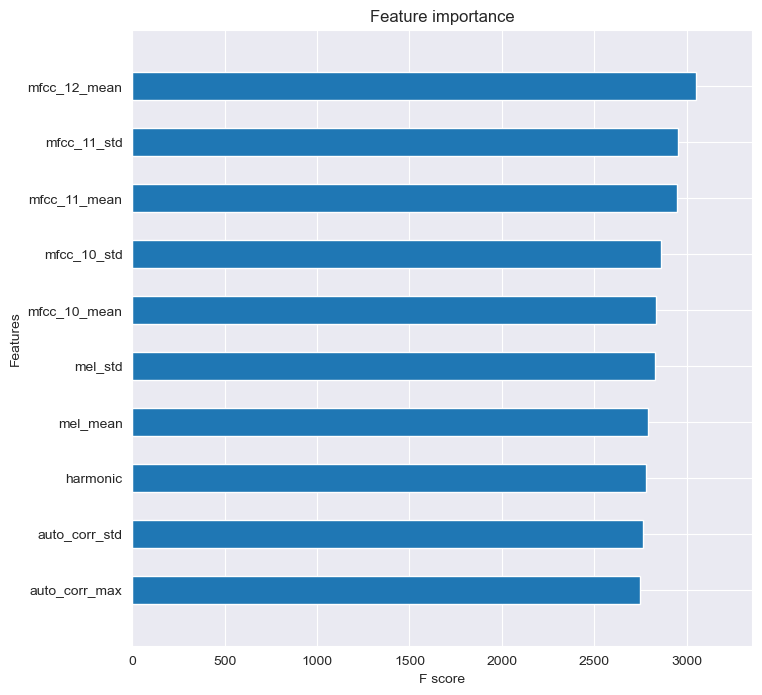

In [77]:
# Extract feature names from x_train_audio and x_train_text
audio_feature_names = x_train_audio.columns.difference(['wav_file', 'label']).tolist()
text_feature_names = pd.DataFrame(x_train_text).columns.to_list()


# Combine feature names
combined_feature_names = audio_feature_names + text_feature_names


# Plot feature importances
ax = xgb.plot_importance(xgb_classifier, max_num_features=10, height=0.5, show_values=False)
fig = ax.figure
fig.set_size_inches(8, 8)

# Add feature names to the plot
ax.set_yticklabels([combined_feature_names[i] for i in ax.get_yticks().astype(int)])

# Save the plot
plt.savefig('feature_importance.png')

# Print contribution scores with feature names
contribution_scores = xgb_classifier.feature_importances_
feature_importance_dict = {feature: score for feature, score in zip(combined_feature_names, contribution_scores)}

# Sort the feature importance dictionary by the importance scores
sorted_feature_importance = sorted(feature_importance_dict.items(), key=lambda item: item[1], reverse=True)

# Print sorted feature importances
for feature, importance in sorted_feature_importance:
    print(f"{feature}: {importance}")

> threshold=0.0046525862999260426, features=136, accuracy=0.6008744534665834
> threshold=0.005073350854218006, features=135, accuracy=0.6046221111805122
> threshold=0.005162385292351246, features=134, accuracy=0.603372891942536
> threshold=0.005244228523224592, features=133, accuracy=0.5965021861336665
> threshold=0.005301071330904961, features=132, accuracy=0.5952529668956902
> threshold=0.005311253946274519, features=131, accuracy=0.5952529668956902
> threshold=0.005327759310603142, features=130, accuracy=0.5927545284197376
> threshold=0.005333650391548872, features=129, accuracy=0.5883822610868208
> threshold=0.005349559709429741, features=128, accuracy=0.5908806995627732
> threshold=0.005359828006476164, features=127, accuracy=0.5940037476577139
> threshold=0.005384606309235096, features=126, accuracy=0.5965021861336665
> threshold=0.005471209064126015, features=125, accuracy=0.5940037476577139
> threshold=0.005476470571011305, features=124, accuracy=0.5883822610868208
> threshold=

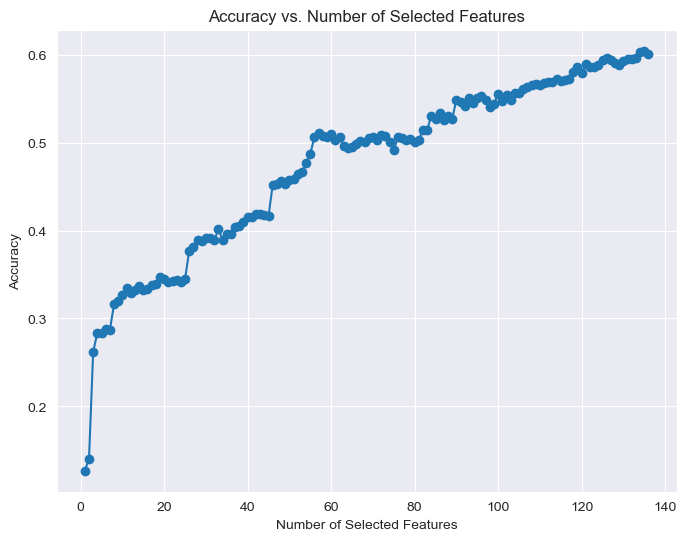

Optimal Threshold: 0.0051
Number of Selected Features: 135
Accuracy at Optimal Threshold: 0.6046


In [80]:
# Get the feature importance scores
importance_scores = xgb_classifier.feature_importances_

# Define a range of threshold values
thresholds = np.sort(xgb_classifier.feature_importances_)

# Initialize lists to store the results
num_features = []
accuracies = []

# Iterate over the threshold values
for threshold in thresholds:
    # Select features using the current threshold
    selector = SelectFromModel(xgb_classifier, threshold=threshold, prefit=True)
    X_train_selected = selector.transform(combined_x_train)
    X_test_selected = selector.transform(combined_x_test)

    # Train a new XGBoost model with the selected features
    selected_model = xgb.XGBClassifier(n_estimators=300, learning_rate=0.05, random_state=42)
    selected_model.fit(X_train_selected, y_train)

    # Evaluate the model on the test set
    y_pred = selected_model.predict(X_test_selected)
    accuracy = accuracy_score(y_test, y_pred)

    # Store the number of selected features and accuracy
    num_features.append(X_train_selected.shape[1])
    accuracies.append(accuracy)

    # Report progress
    print(f'> threshold={threshold}, features={X_train_selected.shape[1]}, accuracy={accuracy}')

# Plot the results
plt.figure(figsize=(8, 6))
plt.plot(num_features, accuracies, marker='o')
plt.xlabel('Number of Selected Features')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Number of Selected Features')
plt.grid(True)
plt.show()

# Find the optimal threshold
optimal_threshold_index = np.argmax(accuracies)
optimal_threshold = thresholds[optimal_threshold_index]
optimal_num_features = num_features[optimal_threshold_index]

print(f"Optimal Threshold: {optimal_threshold:.4f}")
print(f"Number of Selected Features: {optimal_num_features}")
print(f"Accuracy at Optimal Threshold: {accuracies[optimal_threshold_index]:.4f}")

Test Set Accuracy =  0.649
Test Set F-score =  0.662
Test Set Precision =  0.664
Test Set Recall =  0.666
Confusion matrix, without normalization
[[125   7  64   7   5  16]
 [  8 190  36   8  11  47]
 [ 42  33 392  16  24  76]
 [  0   0  15 232   0   0]
 [  1   3  25  14 198   0]
 [ 20  48 135  14  12 136]]


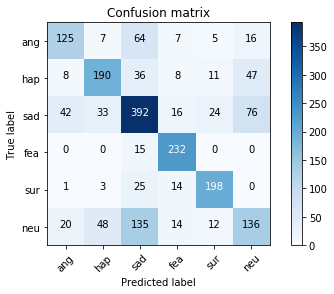

In [9]:
svc_classifier = LinearSVC()

svc_classifier.fit(combined_x_train, y_train)

# Predict
pred = svc_classifier.predict(combined_x_test)

# Results
one_hot_true = one_hot_encoder(y_test, len(pred), len(emotion_dict))
print('Test Set Accuracy =  {0:.3f}'.format(accuracy_score(y_test, pred)))
print('Test Set F-score =  {0:.3f}'.format(f1_score(y_test, pred, average='macro')))
print('Test Set Precision =  {0:.3f}'.format(precision_score(y_test, pred, average='macro')))
print('Test Set Recall =  {0:.3f}'.format(recall_score(y_test, pred, average='macro')))
plot_confusion_matrix(confusion_matrix(y_test, pred), classes=emo_keys)
(y_test, pred_probs)

with open('pred_probas/combined_svc_classifier_model.pkl', 'wb') as f:
    pickle.dump(svc_classifier, f)
    
with open('trained_models/combined/SVC.pkl', 'wb') as f:
    pickle.dump(svc_classifier, f)

Test Set Accuracy =  0.607
Test Set F-score =  0.608
Test Set Precision =  0.719
Test Set Recall =  0.574
Confusion matrix, without normalization
[[ 88  13 107   3   5   8]
 [  4 166  94   3   8  25]
 [ 18  20 509   3   9  24]
 [  0   0  70 177   0   0]
 [  0   8  74   0 159   0]
 [  4  30 224   9   7  91]]


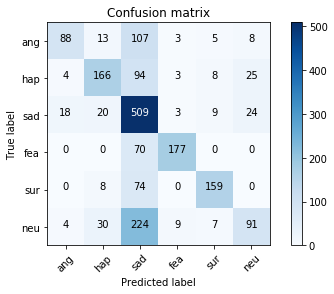

In [10]:
mnb_classifier = MultinomialNB()

mnb_classifier.fit(combined_x_train, y_train)

# Predict
pred_probs = mnb_classifier.predict_proba(combined_x_test)

# Results
display_results(y_test, pred_probs)

with open('pred_probas/combined_mnb_classifier.pkl', 'wb') as f:
    pickle.dump(pred_probs, f)
    
with open('trained_models/combined/MNB.pkl', 'wb') as f:
    pickle.dump(mnb_classifier, f)

Test Set Accuracy =  0.665
Test Set F-score =  0.681
Test Set Precision =  0.676
Test Set Recall =  0.690
Confusion matrix, without normalization
[[120  17  63   3   3  18]
 [ 13 182  35   6  12  52]
 [ 50  42 381   9  17  84]
 [  0   0   0 247   0   0]
 [  1   0  10   3 227   0]
 [ 22  57 126   5   8 147]]


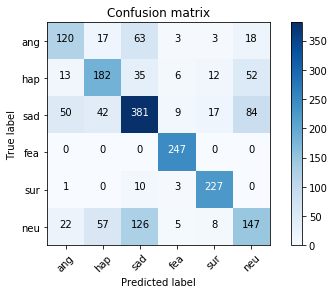

In [11]:
mlp_classifier = MLPClassifier(hidden_layer_sizes=(500, ), activation='relu', solver='adam', alpha=0.0001,
                               batch_size='auto', learning_rate='adaptive', learning_rate_init=0.01,
                               power_t=0.5, max_iter=1000, shuffle=True, random_state=None, tol=0.0001,
                               verbose=False, warm_start=True, momentum=0.8, nesterovs_momentum=True,
                               early_stopping=False, validation_fraction=0.1, beta_1=0.9, beta_2=0.999,
                               epsilon=1e-08)

mlp_classifier.fit(combined_x_train, y_train)

# Predict
pred_probs = mlp_classifier.predict_proba(combined_x_test)

# Results
display_results(y_test, pred_probs)

with open('pred_probas/combined_mlp_classifier.pkl', 'wb') as f:
    pickle.dump(pred_probs, f)
    
with open('trained_models/combined/MLP.pkl', 'wb') as f:
    pickle.dump(mlp_classifier, f)

Test Set Accuracy =  0.631
Test Set F-score =  0.643
Test Set Precision =  0.686
Test Set Recall =  0.620
Confusion matrix, without normalization
[[119   8  77   1   5  14]
 [  9 175  59   4  14  39]
 [ 28  29 450   4  18  54]
 [ 10   0  53 184   0   0]
 [  5   7  49   2 173   5]
 [  7  34 166   9  13 136]]


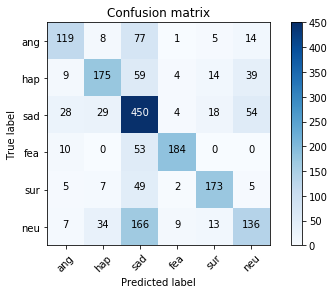

In [12]:
lr_classifier = LogisticRegression(solver='lbfgs', multi_class='multinomial', max_iter=1000)

lr_classifier.fit(combined_x_train, y_train)

# Predict
pred_probs = lr_classifier.predict_proba(combined_x_test)

# Results
display_results(y_test, pred_probs)

with open('pred_probas/combined_lr_classifier.pkl', 'wb') as f:
    pickle.dump(pred_probs, f)
    
with open('trained_models/combined/LR.pkl', 'wb') as f:
    pickle.dump(lr_classifier, f)

[0.00794865 0.00733964 0.00552868 ... 0.         0.         0.        ]


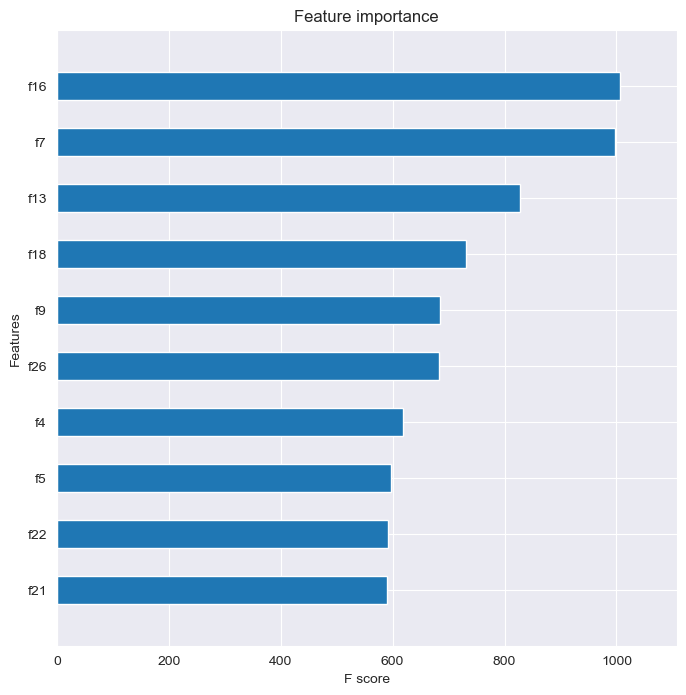

Test Set Accuracy =  0.707
Test Set F-score =  0.716
Test Set Precision =  0.735
Test Set Recall =  0.713
Confusion matrix, without normalization
[[117  11  81   1   3  11]
 [ 11 175  54   4   8  48]
 [ 30  28 470   2   7  46]
 [  0   0   0 247   0   0]
 [  0   0   3   0 238   0]
 [ 12  42 159   6   7 139]]


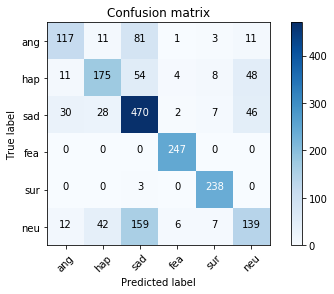

In [17]:
# # Load predicted probabilities
# with open('pred_probas/combined_rf_classifier.pkl', 'rb') as f:
#     rf_pred_probs = pickle.load(f)

# with open('pred_probas/combined_xgb_classifier.pkl', 'rb') as f:
#     xgb_pred_probs = pickle.load(f)
    
# with open('pred_probas/combined_svc_classifier_model.pkl', 'rb') as f:
#     svc_preds = pickle.load(f)
    
# with open('pred_probas/combined_mnb_classifier.pkl', 'rb') as f:
#     mnb_pred_probs = pickle.load(f)
    
# with open('pred_probas/combined_mlp_classifier.pkl', 'rb') as f:
#     mlp_pred_probs = pickle.load(f)
    
# with open('pred_probas/combined_lr_classifier.pkl', 'rb') as f:
#     lr_pred_probs = pickle.load(f)

# with open('pred_probas/combined_lstm_classifier.pkl', 'rb') as f:
#     lstm_pred_probs = pickle.load(f)

# # Average of the predicted probabilites
# ensemble_pred_probs = (xgb_pred_probs +
#                        mlp_pred_probs +
#                        rf_pred_probs +
#                        mnb_pred_probs +
#                        lr_pred_probs)/5.0
# # Show metrics
# display_results(y_test, ensemble_pred_probs)